# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>


## Применение различных нейросетевых моделей

<a href="https://miptstats.github.io/courses/ad_fivt/nn_simple_examples.html" target="_blank">Ранее</a> мы рассмотрели базовые примеры работы с библиотекой PyTorch.
В этом ноутбуке представлены варианты решения различных практических задач с помощью нейронных сетей. Посмотрев этот ноутбук, вы не научитесь решать данные задачи. Главная цель &mdash; *познакомить вас с различными областями применения нейронных сетей и показать как интересен мир*, а научитесь уже <a href="https://miptstats.github.io/courses/ds_fivt.html" target="_blank">на 3 и 4 курсе</a> :)

Отметим, что в этом ноутбуке рассматривается *только применение различных нейросетевых моделей*, обучение моделей не показано. Здесь используются уже кем-то обученные модели, для чего загружаются параметры моделей явным или неявным образом.

Чтобы все корректно отработало, этот ноутбук нужно запускать в той среде, где есть графический процессор (GPU) от Nvidia. Графические процессоры позволяют ускорять матричные вычисления, которые постоянно производятся во время обучения и применения нейронных сетей. Необходимость использования GPU исключительно от Nvidia заключается в том, что PyTorch производит операции на GPU благодаря библиотеке CUDA, которая написана также компанией Nvidia для своих графических процессоров. 

Примером среды, где вы можете бесплатно воспользоваться GPU, служит <a href="https://colab.research.google.com/?hl=ru" target="_blank">Google Colab</a>. Однако учтите, что на данный момент доступ к GPU ограничен работой в несколько (~4) часов в сутки. Для того, чтобы подключиться GPU, зайдите в меню `Среда выполнения`, выберите опцию `Cменить среду выполнения`. В списке аппартных ускорителей выберите GPU.

In [ ]:
# !pip install 'git+https://github.com/facebookresearch/detectron2.git' 

In [3]:
import numpy as np
import requests
import torch

import cv2
import matplotlib.pyplot as plt
from PIL import Image

### 1. Определение объектов на изображении

Наша задача &mdash; для заданных категорий объектов, например, человек, сумка и т.д., определить их местоположение на изображении, если они на нем есть, а также выделить области соотвествующих объектов на картинке и назвать категории выделенных объектов. В области компьютерного зрения эта задача имеет свое название &mdash; объектная сегментация / instance segmentation.

Для решения задачи объектной сегментации будем пользоваться библиотекой <a href="https://github.com/facebookresearch/detectron2" target="_blank">Detectron2</a>. Она удобна тем, что нужно приложить совсем немного услилий, чтобы решить поставленную задачу.

In [4]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

Отобразим изображение, с которым будем работать.



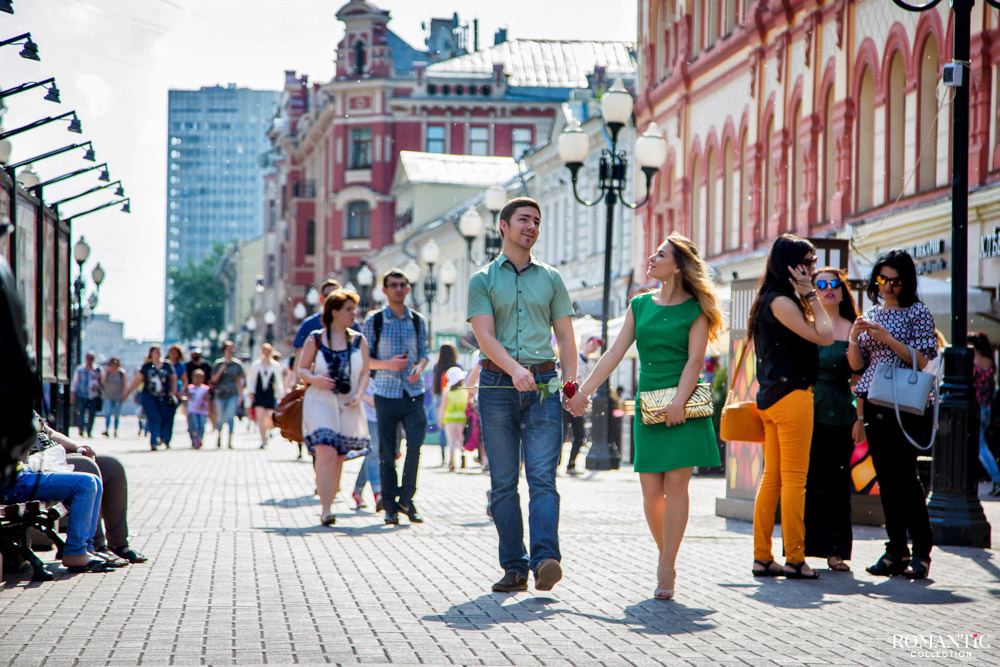

In [5]:
# ссылка на изображение
url = 'https://planeta.romanticcollection.ru/wp-content/uploads/sites/3/nggallery/romantika-starogo-arbata/gallery-348.jpg'
# скачиваем изображение
response = requests.get(url, stream=True).raw

# переводим изображение в numpy-массив
input_image_np = np.asarray(bytearray(response.read()), dtype="uint8")

# переводим изображение в формат open-cv
input_image_cv2 = cv2.imdecode(input_image_np, cv2.IMREAD_COLOR)

# отображаем изображение с помощью PIL.Image
Image.fromarray(input_image_cv2[:, :, ::-1])

Пример работы с локальным изображением.

In [6]:
# # Считываем изображение
# input_image_cv2  = cv2.imread('путь до изображения')

# # Отображаем изображение с помощью PIL.Image
# Image.fromarray(input_image_cv2[:, :, ::-1])

Соберем конфигурацию модели, т.е. определим параметры для инициализации модели. Среди параметров укажем какой класс моделей мы будем использовать, откуда следует загрузить параметры, а также настроим некоторый порог для предсказания. Затем инициализируем модель.





In [7]:
# Собираем конфигурацию
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

# Инициализируем модель
predictor = DefaultPredictor(cfg)

Посмотрим, как выглядит модель. Она состоит из трех основных блоков: `backbone`, `proposal_generator`, `roi_heads`. Для чего они нужны будет рассказно на 3 курсе. Каждый из этих блоков в свою очередь состоит еще из нескольких блоков, которые в итоге построены из модулей PyTorch. Мы даже можем найти уже известные нам модули в архитектуре модели, например, `Sequential` в  `backbone.bottom_up.res2` или `Linear` и `ReLU` в `roi_heads.box_head`.

In [8]:
predictor.model

GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2): Sequential(
        (0): BottleneckBlock

Сделаем предсказание.

In [9]:
outputs = predictor(input_image_cv2)

/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Посмотрим, что получилось. Мы видим, что модель достаточно точно определила области, соотвествущие людям на изображении. Практически все люди задетектированы моделью. Также модель нашла сумки, рюкзак и телефон. Заметим, что объекты одной категории модель отличает друг от друга &mdash; на изображении они выделены разными цветами. Также модель выдает уверенность в предсказании объекта. Интересно, что в предсказании людей модель больше всего уверена, особенно, если они находятся на переднем плане. 

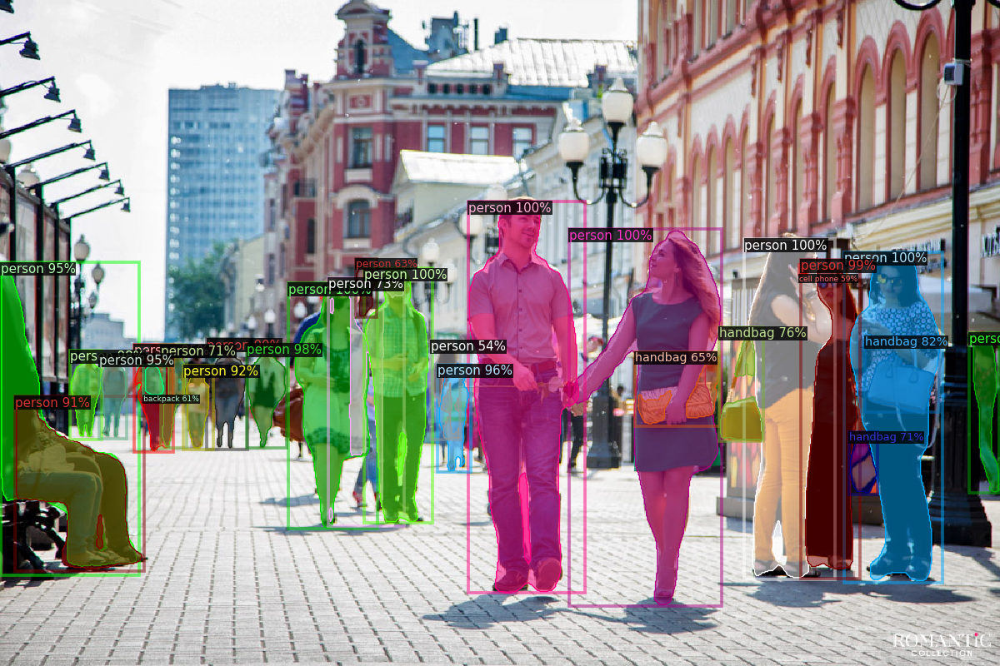

In [10]:
visualizer = Visualizer(
    input_image_cv2[:, :, ::-1], 
    MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), 
    scale=1.2
)
visualizer = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
Image.fromarray(visualizer.get_image())

Теперь решим слегка иную задачу. Она отличается от предыдущей тем, что кроме уже определенных категорий объектов, требуется также определить фоновые области: небо, здания, тротуар и т.д. В области компьютерного зрения эта задача имеет свое название &mdash; паноптическая сегментация / panoptic segmentation.

Так же как и раньше зададим конфигурацию модели, решающей поставленную задачу и зададим саму модель. Среди параметров укажем какой класс моделей мы будем использовать, откуда следует загрузить параметры

In [11]:
# Собираем конфигурацию
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)

Сделаем предсказание.

In [12]:
outputs = predictor(input_image_cv2)

По сравнению с результатом применения предыдущей модели, мы теперь видим, что модель определила тротуар, здания, небо и деревья.

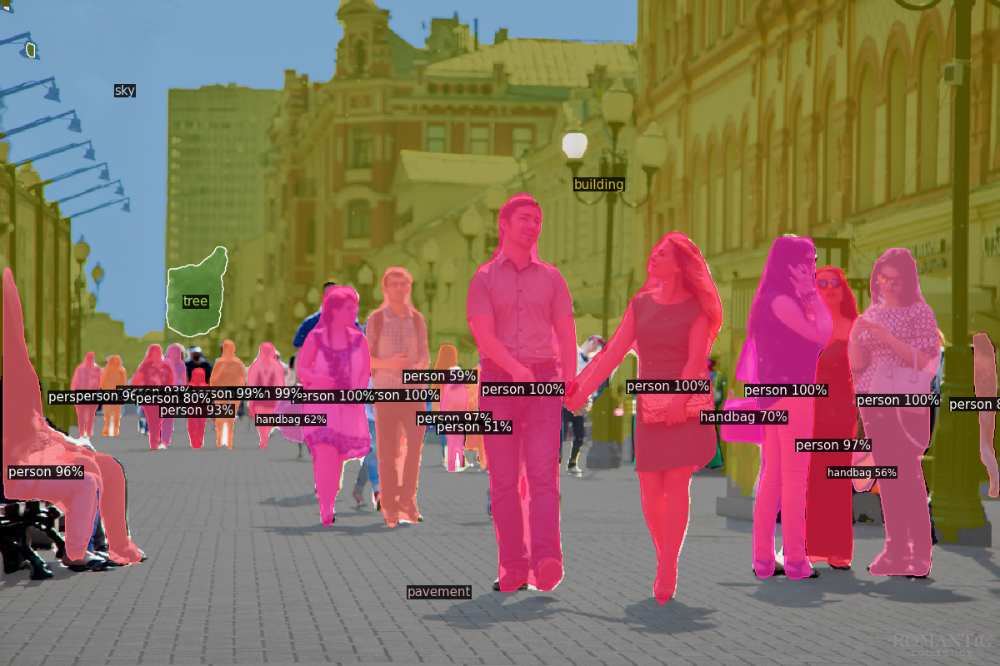

In [13]:
visualizer = Visualizer(
    input_image_cv2[:, :, ::-1], 
    MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), 
    scale=1.2
)
panoptic_seg, segments_info = outputs["panoptic_seg"]
visualizer = visualizer.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
Image.fromarray(visualizer.get_image())

### 2. Детекция точек лица
Детекция точек лица заключается в том, чтобы найти на фотографии ключевые точки, которые обозначают разные части рта, носа, глаз и т.д. Это нужно, например для того, чтобы переносить мимику актеров на персонажей фильма или игры. Для решения этой задачи мы будем использовать библиотеку <a href="https://github.com/1adrianb/face-alignment" target="_blank">face-alignment</a>.


In [ ]:
# !pip install face_alignment

In [14]:
import face_alignment
import urllib

Скачаем изображение.

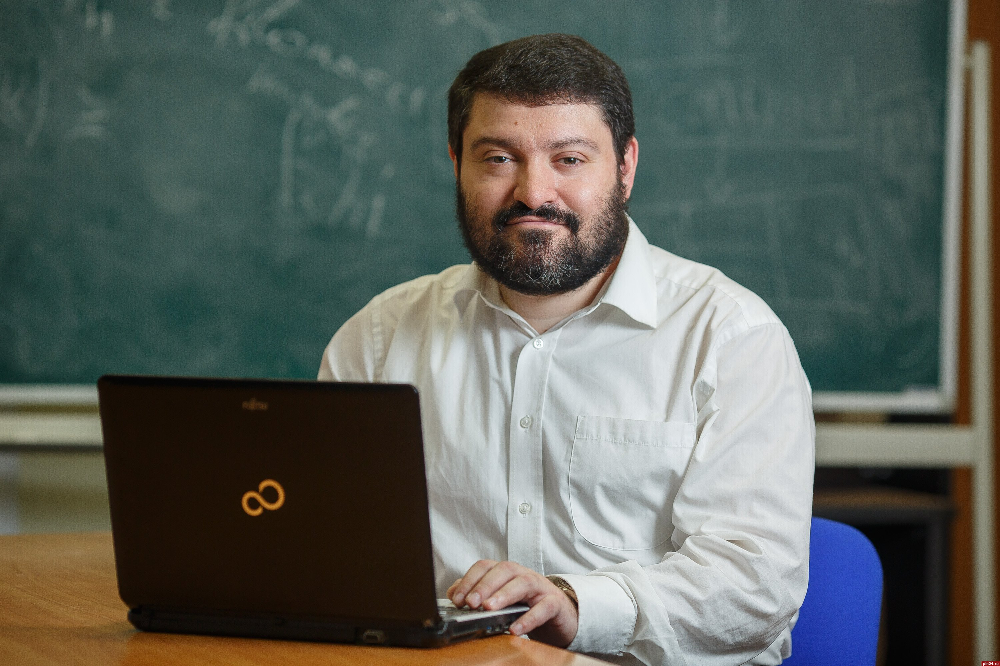

In [15]:
# Скачиваем изображение
urllib.request.urlretrieve("https://pln-pskov.ru/pictures/200110074647.jpg", "face.jpg")

# Отображаем изображение
face_image = Image.open('face.jpg')
face_image

Применим модель.

In [16]:
# Инициализируем модель
fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D, flip_input=False)

# Делаем предсказания
preds = fa.get_landmarks(np.array(face_image))

В результате применения модели мы получили большой набор точек, который хакарктеризует положение головы и мимику персоны. Можно заметить, что точки аккуратно находят границы век, бровей, носа, губ и даже нижнего контура лица, несмотря на наличе бороды.

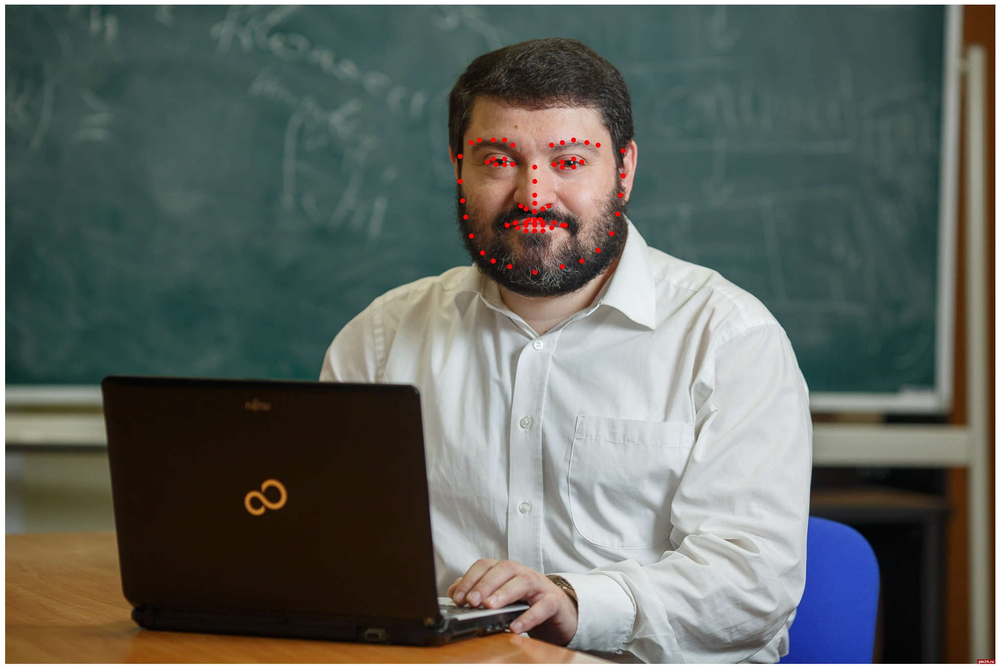

In [17]:
plt.figure(figsize=(25, 25))
plt.axis("off")
plt.imshow(face_image)
for face_keypoints in preds:
    plt.scatter(face_keypoints[:, 0], face_keypoints[:, 1], color="red")

### 3. Генерация текста

Задача генерации текста состоит в том, чтобы по заданному фрагменту текста, сгенерировать читаемый и адекватный текст, соответсвующий этому фрагменту. В большинстве случаев задача ставится именно так, однако не всегда генерация должна опираться на предложенный текст, иногда это может быть изображение, какие-то численные параметры и т.д., также возможна безусловная генерация.

Задача генерации текста особенно актуальна для диалоговых систем, где модель должна поддерживать разговор с человеком. Будем использовать самую популярную библиотеку для применения нейронных моделей к текстам &mdash; <a href="https://huggingface.co/docs/transformers/index" target="_blank">transformers</a>.

In [ ]:
# !pip install accelerate diffusers transformers

In [18]:
from transformers import AutoTokenizer, AutoModelWithLMHead
from transformers import logging

Будем работать с <a href="https://huggingface.co/tinkoff-ai/ruDialoGPT-medium?text=%40%40ПЕРВЫЙ%40%40+что+ты+делал+на+выходных%3F+%40%40ВТОРОЙ%40%40" target="_blank">моделью от Тинькофф</a>, которая способна генерировать текст на русском языке.

In [19]:
tokenizer = AutoTokenizer.from_pretrained("tinkoff-ai/ruDialoGPT-medium")
model = AutoModelWithLMHead.from_pretrained("tinkoff-ai/ruDialoGPT-medium")
model.to("cuda");

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
/usr/local/lib/python3.9/dist-packages/transformers/models/auto/modeling_auto.py:1322: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
  warnings.warn(


Сымитируем диалог с моделью. Для этого будем каждый раз подавать в модель историю всего диалога, а она будет генерировать ответ. При этом специальным образом укажем, что мы работаем в режиме диалога &mdash; свои реплики будем помечать от имени `@@ПЕРВЫЙ@@`, а реплики модели от имени `@@ВТОРОЙ@@`.

Заметим, что результат диалога будет зависеть как от вводимого нами текста, так и от случайности.

In [20]:
N_STEPS = 5

In [22]:
context = ""

for step in range(N_STEPS):
    # Получаем текст от пользователя
    user_text = input("===> Пользователь: ")

    # Создаем контекст для модели
    context += f"@@ПЕРВЫЙ@@ {user_text} @@ВТОРОЙ@@ "

    # Превращаем текст в тензоры
    input_tokens = tokenizer(context, return_tensors='pt').to("cuda")

    # Генерируем ответ
    generated_tokens = model.generate(
        **input_tokens,
        top_k=10,
        top_p=0.95,
        num_beams=3,
        num_return_sequences=1,
        do_sample=True,
        no_repeat_ngram_size=2,
        temperature=1.5,
        repetition_penalty=1.2,
        length_penalty=1.,
        eos_token_id=50257,
        max_new_tokens=40,
    )

    # Превращаем результат генерации в текст
    context_with_gen_text = tokenizer.decode(generated_tokens[0])

    # Отделяем сгенерированный текст от контекста
    gen_text = context_with_gen_text[context_with_gen_text.rfind("@@ВТОРОЙ@@ ") + 11:]
    gen_text = gen_text.replace("@@ПЕРВЫЙ@@", "Пользователь")

    # Выводим сгенерированный текст
    print(f"===> ruDialoGPT: {gen_text}")

    # Обновляем контекст
    context += gen_text.replace("Пользователь", "@@ПЕРВЫЙ@@") + " "


===> Пользователь: Привет!


Setting `pad_token_id` to `eos_token_id`:50257 for open-end generation.


===> ruDialoGPT: 👋🏻💖✨🎂🍷🌺🤗🙃🐈😍😊😘😉😇�
===> Пользователь: Как дела?)


Setting `pad_token_id` to `eos_token_id`:50257 for open-end generation.


===> ruDialoGPT: 😀нормально,а у тебя как?как день прошел?😅😁😂😃😄😆😜😝😛😚😞😕😓
===> Пользователь: Все хорошо) Что делаешь?


Setting `pad_token_id` to `eos_token_id`:50257 for open-end generation.


===> ruDialoGPT: －работаю,учеба,работа,дом,дети,все как у всех. А у вас как день прошёл?☀️😏🥰
===> Пользователь: Модельки проверяю на colab


Setting `pad_token_id` to `eos_token_id`:50257 for open-end generation.


===> ruDialoGPT: スルは、中国的孩在问家﻿﹏�
===> Пользователь: Что это значит?


Setting `pad_token_id` to `eos_token_id`:50257 for open-end generation.


===> ruDialoGPT: 人么是俄罗斯大道这没有给你�


### 4. Генерация видео

Генерация изображений и видео порой может удивить наше воображение. На данный момент лучше всего с данными задачами справляются диффузионные модели. Для работы с ними мы будем использовать библиотеку <a href="https://huggingface.co/docs/diffusers/index" target="_blank">diffusers</a>.

В данном примере, мы будем решать задачу генерации видео на основе заданного текста. Модель должна сгенерировать кадры из видео таким образом, чтобы они соответствовали описанию, а также формировали связанный видео-ряд. 

In [23]:
import numpy as np
import torch
from diffusers import DiffusionPipeline
import imageio
from moviepy import editor

Подготовим пайплайн для генерации видео. Для этого мы будем использовать соответствующую <a href="https://huggingface.co/damo-vilab/text-to-video-ms-1.7b" target="_blank">модель от Alibaba DAMO академии</a>. Также укажем, что мы хотим использовать менее затратную по памяти, но чуть менее качественную версию модели, установив `torch_dtype=torch.float16` и `variant="fp16"`.

In [24]:
pipe = DiffusionPipeline.from_pretrained(
    "damo-vilab/text-to-video-ms-1.7b", 
    torch_dtype=torch.float16, variant="fp16"
)
pipe = pipe.to("cuda")

Зададим текстовый запрос и сгенерируем соответствующее кадры видео. Будем генерировать человека-паука, занимающегося серфингом.

In [25]:
prompt = "Spiderman is surfing"
video_frames = pipe(prompt).frames

  0%|          | 0/50 [00:00<?, ?it/s]

Сохраним полученное видео.

In [26]:
imageio.mimsave("video.mp4", video_frames, fps=8)

Покажем результат.

In [27]:
editor.ipython_display("video.mp4")

В итоге мы получили немного странное видео, где мы можем узнать человека-паука и определить, что он занимается серфингом. Также можно заметить, что при каждом запуске результат генерации будет меняться.